In [279]:
#Import packeges
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import sklearn
import datetime 
import graphviz
import glob

from pandas import DataFrame
from sklearn import linear_model
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
#from mlxtend.evaluate import bias_variance_decomp
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, cross_val_score, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.metrics import roc_curve
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
from datetime import date
from datetime import time

# load and Merge data

In [99]:
df = pd.DataFrame()
# go to path carry excel files
file_list = glob.glob(r"H:\Ghada Lap\AMIT material\Macheine learning\customer churn IBM Data\\**")
# merged excel file.
for file in file_list:
    df = df.append(pd.read_excel(file), ignore_index=True) 
df.to_excel('total.xlsx')

In [100]:
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Streaming Music,Unlimited Data,Monthly Charge,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Satisfaction Score,Customer Status,Churn Category
0,3668-QPYBK,1.0,United States,California,Los Angeles,90003.0,"33.964131, -118.272783",33.964131,-118.272783,Male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,9237-HQITU,1.0,United States,California,Los Angeles,90005.0,"34.059281, -118.30742",34.059281,-118.307420,Female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,9305-CDSKC,1.0,United States,California,Los Angeles,90006.0,"34.048013, -118.293953",34.048013,-118.293953,Female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,7892-POOKP,1.0,United States,California,Los Angeles,90010.0,"34.062125, -118.315709",34.062125,-118.315709,Female,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0280-XJGEX,1.0,United States,California,Los Angeles,90015.0,"34.039224, -118.266293",34.039224,-118.266293,Male,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36886 entries, 0 to 36885
Data columns (total 59 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   CustomerID                         35215 non-null  object 
 1   Count                              35215 non-null  float64
 2   Country                            14086 non-null  object 
 3   State                              14086 non-null  object 
 4   City                               14086 non-null  object 
 5   Zip Code                           15757 non-null  float64
 6   Lat Long                           14086 non-null  object 
 7   Latitude                           14086 non-null  float64
 8   Longitude                          14086 non-null  float64
 9   Gender                             14086 non-null  object 
 10  Senior Citizen                     14086 non-null  object 
 11  Partner                            7043 non-null   obj

(36886, 59)

In [57]:
file_list1=pd.read_excel('H:\\Ghada Lap\\AMIT material\\Macheine learning\\customer churn IBM Data\\Telco_customer_churn.xlsx')
file_list2=pd.read_excel('H:\\Ghada Lap\\AMIT material\\Macheine learning\\customer churn IBM Data\\Telco_customer_churn_demographics.xlsx')
#file_list3 same data in file_list1 drop all file
#file_list3=pd.read_excel('H:\\Ghada Lap\\AMIT material\\Macheine learning\\customer churn IBM Data\\Telco_customer_churn_location.xlsx')
file_list4=pd.read_excel('H:\\Ghada Lap\\AMIT material\\Macheine learning\\customer churn IBM Data\\Telco_customer_churn_population.xlsx')
# merge data accordding Zip code and drop ID not nessasry columns
file_list5=pd.read_excel('H:\\Ghada Lap\\AMIT material\\Macheine learning\\customer churn IBM Data\\Telco_customer_churn_services.xlsx')
file_list6=pd.read_excel('H:\\Ghada Lap\\AMIT material\\Macheine learning\\customer churn IBM Data\\Telco_customer_churn_status.xlsx')

In [72]:
excel_merged = pd.DataFrame() 
excel_merged = file_list1[['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code','Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen','Partner', 'Dependents', 'Tenure Months', 'Phone Service','Multiple Lines', 'Internet Service', 'Online Security','Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV','Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method','Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value','Churn Score', 'CLTV', 'Churn Reason']].merge(file_list2[['CustomerID', 'Age', 'Under 30','Married', 'Number of Dependents']], 
                                     on = 'CustomerID', how = 'left')
excel_merged.to_excel('1_TELCO CHURN PREDICTION.xlsx', index=False)

In [73]:
excel_merged1 = pd.DataFrame() 
excel_merged1 = file_list1[['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code','Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen','Partner', 'Dependents', 'Tenure Months', 'Phone Service','Multiple Lines', 'Internet Service', 'Online Security','Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV','Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method','Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value','Churn Score', 'CLTV', 'Churn Reason']].merge(file_list5[['CustomerID','Quarter','Referred a Friend', 'Number of Referrals', 'Tenure in Months', 'Offer','Phone Service',
       'Avg Monthly Long Distance Charges','Multiple Lines' ,'Internet Service','Internet Type',
       'Avg Monthly GB Download','Online Security', 'Online Backup','Device Protection Plan',
       'Premium Tech Support', 'Streaming TV','Streaming Music', 'Unlimited Data','Contract','Paperless Billing','Payment Method',
       'Monthly Charge','Total Charges', 'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Total Revenue']], 
                                     on = 'CustomerID', how = 'left')
excel_merged1.to_excel('2_TELCO CHURN PREDICTION.xlsx', index=False)

In [78]:
excel_merged2 = pd.DataFrame() 
excel_merged2 = file_list1[['CustomerID', 'Zip Code']].merge(file_list4[['Zip Code', 'Population']], 
                                     on = 'Zip Code', how = 'left')
excel_merged2.to_excel('3_TELCO CHURN PREDICTION.xlsx', index=False)

In [102]:
data1 = pd.read_excel('1_TELCO CHURN PREDICTION.xlsx')
data2 =pd.read_excel('2_TELCO CHURN PREDICTION.xlsx')
data3 =pd.read_excel('3_TELCO CHURN PREDICTION.xlsx')

In [91]:
excel_merged3 = pd.DataFrame() 
excel_merged3 = data1[['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason', 'Age', 'Under 30', 'Married',
       'Number of Dependents']].merge(data2[['CustomerID','Quarter', 'Referred a Friend', 'Number of Referrals',
       'Tenure in Months', 'Offer', 'Phone Service_y',
       'Avg Monthly Long Distance Charges', 'Multiple Lines_y',
       'Internet Service_y', 'Internet Type', 'Avg Monthly GB Download',
       'Online Security_y', 'Online Backup_y', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV_y', 'Streaming Music',
       'Unlimited Data', 'Contract_y', 'Paperless Billing_y',
       'Payment Method_y', 'Monthly Charge', 'Total Charges_y',
       'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Total Revenue']], on = 'CustomerID', how = 'left')
#excel_merged = excel_merged.append(excel_file, ignore_index=True)
excel_merged3.to_excel('4_TELCO CHURN PREDICTION.xlsx', index=False)

In [103]:
data4 = pd.read_excel('4_TELCO CHURN PREDICTION.xlsx')

In [95]:
excel_merged4 = pd.DataFrame() 
excel_merged4 = data4[['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason', 'Age', 'Under 30', 'Married',
       'Number of Dependents', 'Quarter', 'Referred a Friend',
       'Number of Referrals', 'Tenure in Months', 'Offer', 'Phone Service_y',
       'Avg Monthly Long Distance Charges', 'Multiple Lines_y',
       'Internet Service_y', 'Internet Type', 'Avg Monthly GB Download',
       'Online Security_y', 'Online Backup_y', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV_y', 'Streaming Music',
       'Unlimited Data', 'Contract_y', 'Paperless Billing_y',
       'Payment Method_y', 'Monthly Charge', 'Total Charges_y',
       'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Total Revenue']].merge(data3[['CustomerID', 'Population']], on = 'CustomerID', how = 'left')
#excel_merged = excel_merged.append(excel_file, ignore_index=True)
excel_merged4.to_excel('total_TELCO CHURN PREDICTION.xlsx', index=False)

In [107]:
data = pd.read_excel('total_TELCO CHURN PREDICTION.xlsx')
data.shape

(7043, 65)

In [104]:
data.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract_y,Paperless Billing_y,Payment Method_y,Monthly Charge,Total Charges_y,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Population
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-Month,Yes,Credit Card,53.85,108.15,0.0,0,20.94,129.09,58198
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-Month,Yes,Bank Withdrawal,70.70,151.65,0.0,0,18.24,169.89,43019
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-Month,Yes,Bank Withdrawal,99.65,820.50,0.0,0,97.20,917.70,62784
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-Month,Yes,Bank Withdrawal,104.80,3046.05,0.0,0,136.92,3182.97,1957
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-Month,Yes,Bank Withdrawal,103.70,5036.30,0.0,0,2172.17,7208.47,15140


# Summary statistics

In [156]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 65 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   CustomerID                         7043 non-null   object 
 1   Count                              7043 non-null   int64  
 2   Country                            7043 non-null   object 
 3   State                              7043 non-null   object 
 4   City                               7043 non-null   object 
 5   Zip Code                           7043 non-null   int64  
 6   Lat Long                           7043 non-null   object 
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Gender                             7043 non-null   object 
 10  Senior Citizen                     7043 non-null   object 
 11  Partner                            7043 non-null   objec

In [141]:
data.isna().sum().sum()

5174

In [112]:
#This function takes a dataframe and searches for all the columns having the minimum percentage of null values and return the list of all such columns"""
def colfinder_havingnull(dataframe,min_ratio=0.5):
    filter=dataframe.isnull().sum()/dataframe.shape[0]>min_ratio
    return list(dataframe.columns[filter])

In [200]:
col_not_helpful=['CustomerID','Count','Quarter','State','Churn Label','Streaming TV_y','Contract_y', 'Paperless Billing_y', 'Payment Method_y','Phone Service_y','Online Security_y', 'Online Backup_y', 'Multiple Lines_y', 'Internet Service_y','Country','Lat Long','Monthly Charges']+colfinder_havingnull(data)
col_not_helpful

['CustomerID',
 'Count',
 'Quarter',
 'State',
 'Churn Label',
 'Streaming TV_y',
 'Contract_y',
 'Paperless Billing_y',
 'Payment Method_y',
 'Phone Service_y',
 'Online Security_y',
 'Online Backup_y',
 'Multiple Lines_y',
 'Internet Service_y',
 'Country',
 'Lat Long',
 'Monthly Charges',
 'Churn Reason']

In [201]:
#It is a class that takes in the list of columns to be deleted and returns the result dataframe"""
class Columndeleter(BaseEstimator,TransformerMixin):  
    def __init__(self,lst):
        self.lst=lst
    def fit(self,X,y=None):
        return self
    def transform(self,X,y=None):
        return data.drop(self.lst,axis=1)

In [202]:
cl=Columndeleter(col_not_helpful)
Data=cl.fit_transform(data)
Data.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,...,Premium Tech Support,Streaming Music,Unlimited Data,Monthly Charge,Total Charges_y,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,Yes,53.85,108.15,0.0,0,20.94,129.09,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,Yes,70.70,151.65,0.0,0,18.24,169.89,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,No,Yes,Yes,99.65,820.50,0.0,0,97.20,917.70,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,104.80,3046.05,0.0,0,136.92,3182.97,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,No,Yes,Yes,103.70,5036.30,0.0,0,2172.17,7208.47,15140


In [203]:
#Unique values of Features
#Data['Churn Score'].unique()
num_cols = Data.select_dtypes(include='number')
cat_cols = Data.select_dtypes(include='object')
print(f'Numerical Columns: {num_cols.columns.tolist()}')
print(f'Categorical Columns: {cat_cols.columns.tolist()}\n')
print('\n\nUnique Values In Categorical columns:')
[f'{col}:   {cat_cols[col].unique()}' for col in cat_cols]

Numerical Columns: ['Zip Code', 'Latitude', 'Longitude', 'Tenure Months', 'Churn Value', 'Churn Score', 'CLTV', 'Age', 'Number of Dependents', 'Number of Referrals', 'Tenure in Months', 'Avg Monthly Long Distance Charges', 'Avg Monthly GB Download', 'Monthly Charge', 'Total Charges_y', 'Total Refunds', 'Total Extra Data Charges', 'Total Long Distance Charges', 'Total Revenue', 'Population']
Categorical Columns: ['City', 'Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method', 'Total Charges', 'Under 30', 'Married', 'Referred a Friend', 'Offer', 'Internet Type', 'Device Protection Plan', 'Premium Tech Support', 'Streaming Music', 'Unlimited Data']



Unique Values In Categorical columns:


["City:   ['Los Angeles' 'Beverly Hills' 'Huntington Park' ... 'Standish' 'Tulelake'\n 'Olympic Valley']",
 "Gender:   ['Male' 'Female']",
 "Senior Citizen:   ['No' 'Yes']",
 "Partner:   ['No' 'Yes']",
 "Dependents:   ['No' 'Yes']",
 "Phone Service:   ['Yes' 'No']",
 "Multiple Lines:   ['No' 'Yes' 'No phone service']",
 "Internet Service:   ['DSL' 'Fiber optic' 'No']",
 "Online Security:   ['Yes' 'No' 'No internet service']",
 "Online Backup:   ['Yes' 'No' 'No internet service']",
 "Device Protection:   ['No' 'Yes' 'No internet service']",
 "Tech Support:   ['No' 'Yes' 'No internet service']",
 "Streaming TV:   ['No' 'Yes' 'No internet service']",
 "Streaming Movies:   ['No' 'Yes' 'No internet service']",
 "Contract:   ['Month-to-month' 'Two year' 'One year']",
 "Paperless Billing:   ['Yes' 'No']",
 "Payment Method:   ['Mailed check' 'Electronic check' 'Bank transfer (automatic)'\n 'Credit card (automatic)']",
 'Total Charges:   [108.15 151.65 820.5 ... 7362.9 346.45 6844.5]',
 "Under 

In [204]:
Data.isna().sum().sum()

0

In [205]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 47 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   City                               7043 non-null   object 
 1   Zip Code                           7043 non-null   int64  
 2   Latitude                           7043 non-null   float64
 3   Longitude                          7043 non-null   float64
 4   Gender                             7043 non-null   object 
 5   Senior Citizen                     7043 non-null   object 
 6   Partner                            7043 non-null   object 
 7   Dependents                         7043 non-null   object 
 8   Tenure Months                      7043 non-null   int64  
 9   Phone Service                      7043 non-null   object 
 10  Multiple Lines                     7043 non-null   object 
 11  Internet Service                   7043 non-null   objec

In [232]:
data_new=Data.drop(labels=['Latitude','Longitude','Senior Citizen'],axis=1)
data_new.shape

(7043, 44)

In [230]:
#convert all object data to string
#stringcols = Data.select_dtypes(include='object').columns
#Data[stringcols] = Data[stringcols].fillna('column').astype(str)
DataS=data_new.astype(str)

In [231]:
## Encoder data 
le = LabelEncoder()
data_LE = DataS.apply(le.fit_transform)
data_LE.head()

,City,Zip Code,Gender,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,...,Premium Tech Support,Streaming Music,Unlimited Data,Monthly Charge,Total Charges_y,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Population
0,562,2,1,0,0,12,1,0,0,2,...,0,0,1,740,156,0,0,2069,662,1286
1,562,4,0,0,1,12,1,0,1,0,...,0,0,1,1033,924,0,0,1745,1211,1039
2,562,5,0,0,1,71,1,2,1,0,...,0,1,1,1578,6113,0,0,6002,6638,1344
3,562,8,0,1,1,21,1,2,1,0,...,1,1,1,90,2650,0,0,860,2894,349
4,562,13,1,0,1,44,1,2,1,0,...,0,1,1,68,4269,0,0,2327,5618,187


In [208]:
Data.describe()

,Zip Code,Latitude,Longitude,Tenure Months,Churn Value,Churn Score,CLTV,Age,Number of Dependents,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges_y,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Population
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,93521.964646,36.282441,-119.798880,32.371149,0.265370,58.699418,4400.295755,46.509726,0.468692,1.951867,32.386767,22.958954,20.515405,64.761692,2280.381264,1.962182,6.860713,749.099262,3034.379056,21181.589238
std,1865.794555,2.455723,2.157889,24.559481,0.441561,21.525131,1183.057152,16.750352,0.962802,3.001199,24.542061,15.448113,20.418940,30.090047,2266.220462,7.902614,25.104978,846.660055,2865.204542,20901.246553
min,90001.000000,32.555828,-124.301372,0.000000,0.000000,5.000000,2003.000000,19.000000,0.000000,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,21.360000,11.000000
25%,92102.000000,34.030915,-121.815412,9.000000,0.000000,40.000000,3469.000000,32.000000,0.000000,0.000000,9.000000,9.210000,3.000000,35.500000,400.150000,0.000000,0.000000,70.545000,605.610000,2048.000000
50%,93552.000000,36.391777,-119.730885,29.000000,0.000000,61.000000,4527.000000,46.000000,0.000000,0.000000,29.000000,22.890000,17.000000,70.350000,1394.550000,0.000000,0.000000,401.440000,2108.640000,15975.000000
75%,95351.000000,38.224869,-118.043237,55.000000,1.000000,75.000000,5380.500000,60.000000,0.000000,3.000000,55.000000,36.395000,27.000000,89.850000,3786.600000,0.000000,0.000000,1191.100000,4801.145000,34146.000000
max,96161.000000,41.962127,-114.192901,72.000000,1.000000,100.000000,6500.000000,80.000000,9.000000,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000,105285.000000


In [209]:
data_LE.describe(include='all')

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,...,Premium Tech Support,Streaming Music,Unlimited Data,Monthly Charge,Total Charges_y,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Population
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,...,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,593.713616,787.916939,793.535567,796.181883,0.504756,0.162147,0.483033,0.231010,35.056368,0.903166,...,0.290217,0.353259,0.673719,783.182877,3266.599318,18.687065,0.743433,2749.367883,3488.403379,796.427091
std,314.990288,485.636593,480.597035,478.117231,0.500013,0.368612,0.499748,0.421508,23.933754,0.295752,...,0.453895,0.478016,0.468885,466.006171,1888.659475,76.831579,2.636918,1893.502176,2015.934620,459.865945
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,337.000000,352.000000,376.000000,390.000000,0.000000,0.000000,0.000000,0.000000,12.000000,1.000000,...,0.000000,0.000000,0.000000,338.000000,1610.000000,0.000000,0.000000,1038.500000,1746.500000,400.500000
50%,601.000000,771.000000,771.000000,771.000000,1.000000,0.000000,0.000000,0.000000,34.000000,1.000000,...,0.000000,0.000000,1.000000,761.000000,3258.000000,0.000000,0.000000,2722.000000,3485.000000,794.000000
75%,869.000000,1211.000000,1211.000000,1211.000000,1.000000,0.000000,1.000000,0.000000,58.000000,1.000000,...,1.000000,1.000000,1.000000,1204.000000,4910.500000,0.000000,0.000000,4397.500000,5232.500000,1193.000000
max,1128.000000,1651.000000,1651.000000,1650.000000,1.000000,1.000000,1.000000,1.000000,72.000000,1.000000,...,1.000000,1.000000,1.000000,1584.000000,6539.000000,499.000000,15.000000,6080.000000,6983.000000,1591.000000


# Dataset Information
1- customerID- Customer ID

2- gender- Whether the customer is a male or a female

3- SeniorCitizen- Whether the customer is a senior citizen or not (1, 0)

4- Partner- Whether the customer has a partner or not (Yes, No)

5- Dependents- Whether the customer has dependents or not (Yes, No)

6- tenure- Number of months the customer has stayed with the company

7- PhoneService- Whether the customer has a phone service or not (Yes, No)

8- MultipleLines- Whether the customer has multiple lines or not (Yes, No, No phone service)

9- InternetService- Customer’s internet service provider (DSL, Fiber optic, No)

10- OnlineSecurity- Whether the customer has online security or not (Yes, No, No internet service)

11- OnlineBackup- Whether the customer has online backup or not (Yes, No, No internet service)

12- DeviceProtection- Whether the customer has device protection or not (Yes, No, No internet service)

13- TechSupport- Whether the customer has tech support or not (Yes, No, No internet service)

14- StreamingTV- Whether the customer has streaming TV or not (Yes, No, No internet service)

15- StreamingMovies- Whether the customer has streaming movies or not (Yes, No, No internet service)

16- Contract- The contract term of the customer (Month-to-month, One year, Two year)

17- PaperlessBilling- Whether the customer has paperless billing or not (Yes, No)

18- PaymentMethod- The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))

19- MonthlyCharges- The amount charged to the customer monthly

20- TotalCharges- The total amount charged to the customer

21- Churn- Whether the customer churned or not (Yes or No)

22- City: 'Los Angeles' 'Beverly Hills' 'Huntington Park' ... 'Standish' 'Tulelake'\n 'Olympic Valley'

23- Under 30:   'No' 'Yes'

24- Married:   'No' 'Yes'

25- Referred a Friend:   'No' 'Yes'

26- Offer:  'None' 'Offer C' 'Offer E' 'Offer D' 'Offer A' 'Offer B'

27- Multiple Lines_y:   'No' 'Yes'

28- Internet Service_y:  'Yes' 'No'

29- Internet Type:  'DSL' 'Fiber Optic' 'Cable' 'None'

30- Online Security_y: 'Yes' 'No'

31- Online Backup_y:   'Yes' 'No'

32- Device Protection Plan:   'No' 'Yes'

33- Premium Tech Support:   'No' 'Yes'

34- Unlimited Data:   'Yes' 'No'

# EDA

#https://jakevdp.github.io/PythonDataScienceHandbook/04.13-geographic-data-with-basemap.html

In [153]:
import plotly.express as px
import geopandas as gpd

ModuleNotFoundError: No module named 'geopandas'

Text(0.5, 1.0, '% of Payment Method')

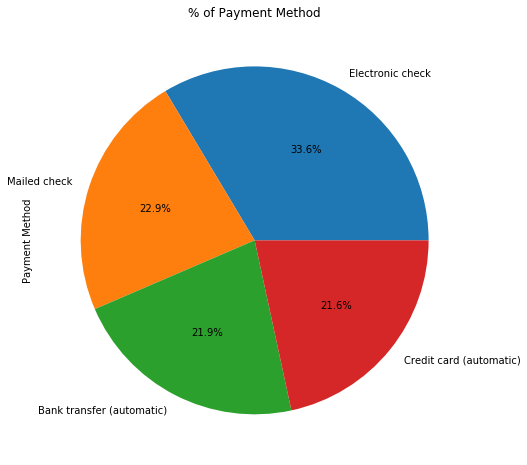

In [221]:
#fig, axes = plt.subplots(1, 2, figsize=(8,12)) # plot 6 graphs
data['Payment Method'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(10,8));
plt.title("% of Payment Method")

Text(0.5, 1.0, '% Churn')

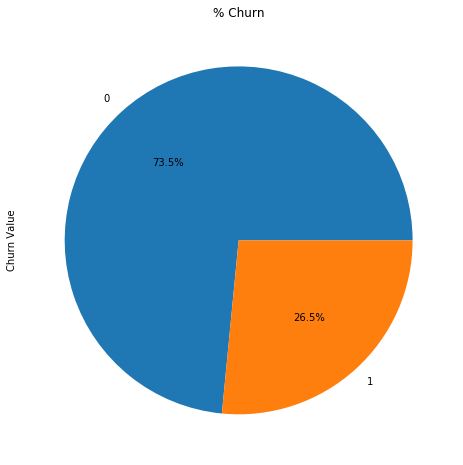

In [222]:
data['Churn Value'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(10,8));
plt.title("% Churn")

Text(0.5, 1.0, '% Internet Type')

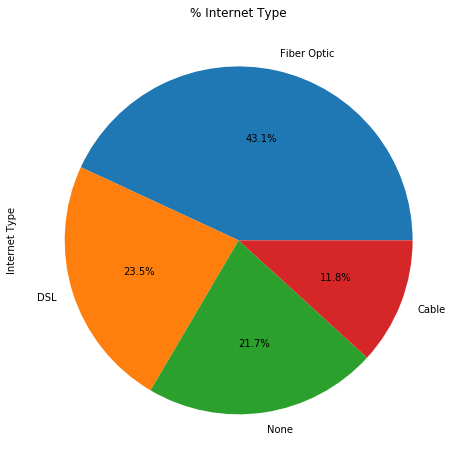

In [225]:
data['Internet Type'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(10,8));
plt.title("% Internet Type")

Text(0.5, 1.0, 'Churn_ Internet Type')

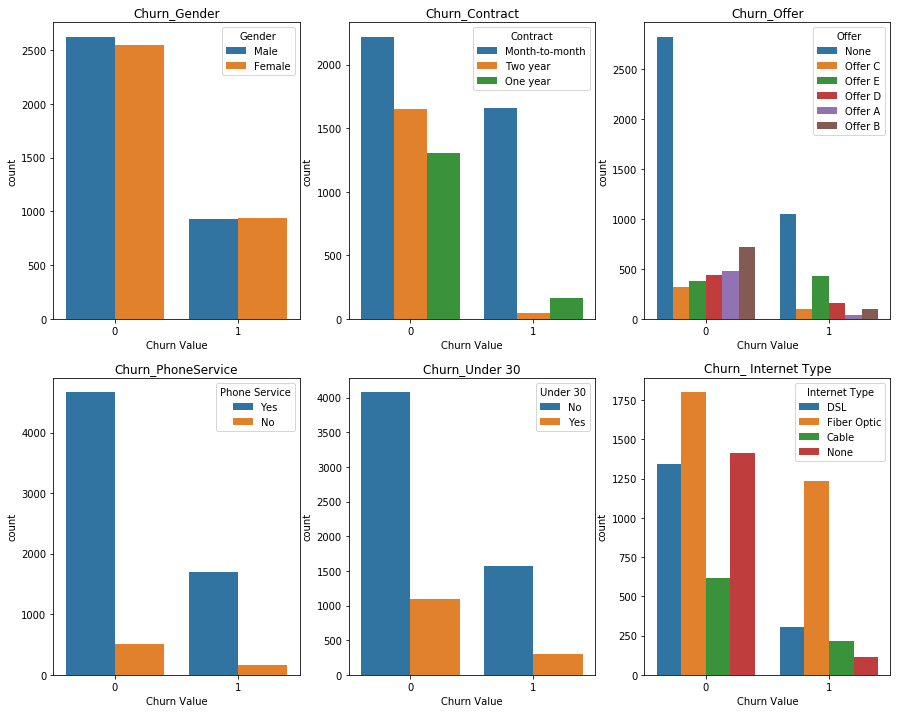

In [217]:
#Categorical Variables
fig, axes = plt.subplots(2, 3, figsize=(15,12)) # plot 6 graphs
sns.countplot("Churn Value", data=data,hue="Gender", ax=axes[0,0]).set_title('Churn_Gender')
sns.countplot("Churn Value", data=data,hue="Contract", ax=axes[0,1]).set_title('Churn_Contract')
sns.countplot("Churn Value", data=data,hue="Phone Service", ax=axes[1,0]).set_title('Churn_PhoneService')
sns.countplot("Churn Value", data=data,hue="Under 30", ax=axes[1,1]).set_title('Churn_Under 30')
sns.countplot("Churn Value", data=data,hue="Offer", ax=axes[0,2]).set_title('Churn_Offer')
sns.countplot("Churn Value", data=data,hue="Internet Type", ax=axes[1,2]).set_title('Churn_ Internet Type')

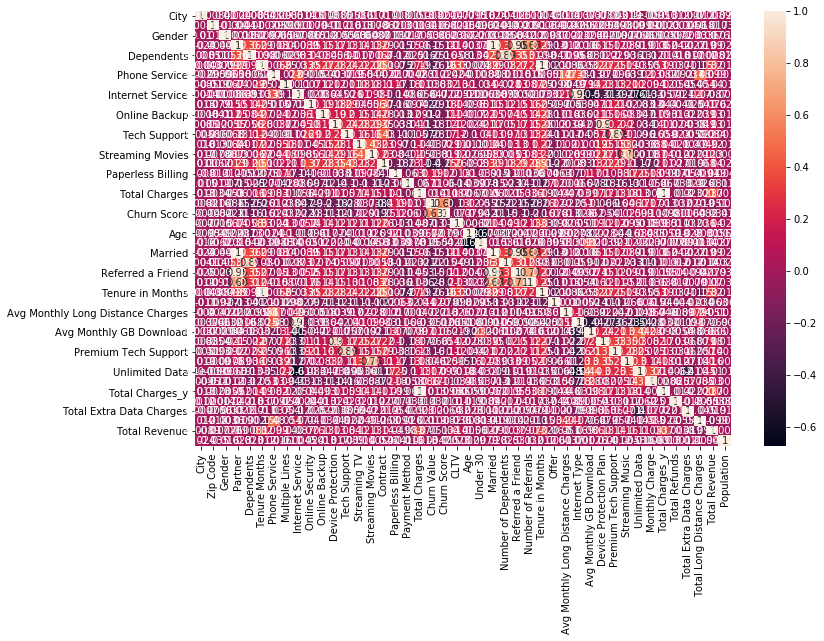

In [233]:
fig, axes = plt.subplots(1, 1, figsize=(12,8)) 
sns.heatmap(data_LE.corr(), annot=True)

In [234]:
sns.pairplot(data_LE)

# Telco Customer Churn Prediction Model

In [235]:
# train_test_split for data
x = data_LE.drop(['Churn Value'],axis=1)
y = data_LE['Churn Value']

x_train,x_test, y_train,y_test  = train_test_split(x,y, test_size=0.33, random_state=42)

In [259]:
###function to Checking the Scores

def check_scores(model, x_train, x_test):
    # Making predictions on train and test data
    train_class_preds = model.predict(x_train)
    test_class_preds = model.predict(x_test)

    # Get the probabilities on train and test
    train_preds = model.predict_proba(x_train)[:,1]
    test_preds = model.predict_proba(x_test)[:,1]

  # Calculating accuracy on train and test
    train_accuracy = metrics.accuracy_score(y_train,train_class_preds)
    test_accuracy = metrics.accuracy_score(y_test,test_class_preds)
  
    print("The accuracy on train dataset is", train_accuracy)
    print("The accuracy on test dataset is", test_accuracy)
    print()
    
   # Get the confusion matrices for train and test
    train_cm = confusion_matrix(y_train,train_class_preds)
    test_cm = confusion_matrix(y_test,test_class_preds )

    print('Train confusion matrix:')
    print( train_cm)
    print()
    print('Test confusion matrix:')
    print(test_cm)
    print()
   # Get the roc_auc score for train and test dataset
    train_auc = metrics.roc_auc_score(y_train,train_preds)
    test_auc = metrics.roc_auc_score(y_test,test_preds)

    print('AUC on train data:', train_auc)
    print('AUC on test data:', test_auc)
   
   # Fscore, precision and recall on test data
    f1 = metrics.f1_score(y_test, test_class_preds)
    precision = metrics.precision_score(y_test, test_class_preds)
    recall = metrics.recall_score(y_test, test_class_preds)
    print("F1 score is:",f1 )
    print("Precision is:",precision)
    print("Recall is:", recall)
    
    return model, train_auc, test_auc, train_accuracy, test_accuracy,f1, precision,recall

# Classification Models

## Model 1 : LR(LogisticRegression)

In [256]:
# get Best parameters for this models
CV = KFold(n_splits=10, random_state=0, shuffle=True)
LR_S = LogisticRegression(random_state = 42)
params_LR = {'C': list(np.arange(1,12)), 'penalty': ['l1', 'l2', 'elasticnet', 'none'] , 'class_weight': ['balanced','None']}
randomsearch= RandomizedSearchCV(LR_S, param_distributions=params_LR, cv=5, n_jobs=-1, n_iter=20, random_state=42, return_train_score=True)
randomsearch.fit(x_train, y_train)
print('Best parameters:',randomsearch.best_estimator_)

C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
60 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 449, in _check_solver
    % (solver, penalty)
Value

Best parameters: LogisticRegression(C=7, class_weight='None', random_state=42)


C:\Users\user\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [283]:
lr_optimal_model= LogisticRegression(random_state = 42, penalty= 'l2', class_weight= 'None', C=7)
lr_optimal_model.fit(x_train, y_train)
lr_model, lr_train_auc, lr_test_auc, lr_train_accuracy, lr_test_accuracy,lr_f1, lr_precision, lr_recall= check_scores(lr_optimal_model,x_train,x_test)

The accuracy on train dataset is 0.8397626112759644
The accuracy on test dataset is 0.829247311827957

Train confusion matrix:
[[3128  362]
 [ 394  834]]

Test confusion matrix:
[[1496  188]
 [ 209  432]]

AUC on train data: 0.8858772854969525
AUC on test data: 0.8797241913429505
F1 score is: 0.6851704996034893
Precision is: 0.6967741935483871
Recall is: 0.6739469578783152


C:\Users\user\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


## Model 2 : KNN Algorithm

In [269]:
# get Best parameters for this models
KNN_S = KNeighborsClassifier()
params_KNN = {'n_neighbors': list(range(1,100))}
grid_KNN = RandomizedSearchCV(KNN_S, param_distributions=params_KNN, cv=5, n_jobs=-1, n_iter=20, random_state=42, return_train_score=True)
grid_KNN.fit(x_train, y_train)
print('Best parameters:', grid_KNN.best_estimator_)

Best parameters: KNeighborsClassifier(n_neighbors=65)


              precision    recall  f1-score   support

           0       0.74      0.98      0.84      1684
           1       0.60      0.08      0.15       641

    accuracy                           0.73      2325
   macro avg       0.67      0.53      0.49      2325
weighted avg       0.70      0.73      0.65      2325

[[1648   36]
 [ 588   53]]
The accuracy on train dataset is 0.7511657481983891
The accuracy on test dataset is 0.7316129032258064

Train confusion matrix:
[[3418   72]
 [1102  126]]

Test confusion matrix:
[[1648   36]
 [ 588   53]]

AUC on train data: 0.7229613693848409
AUC on test data: 0.6862023412052871
F1 score is: 0.14520547945205478
Precision is: 0.5955056179775281
Recall is: 0.08268330733229329


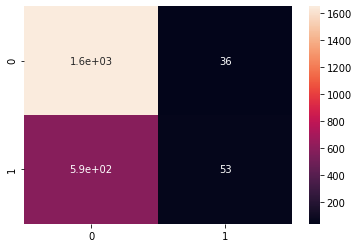

In [289]:
KNN_model = KNeighborsClassifier(n_neighbors=65)
KNN_model.fit(x_train,y_train)
y_pred = KNN_model.predict(x_test)
#y_pred
print(classification_report(y_test,y_pred))
con_mat = confusion_matrix(y_test, y_pred)
print(con_mat)
# plot confusion matrix
sns.heatmap(con_mat, annot=True)
KNN_model, KNN_train_auc, KNN_test_auc, KNN_train_accuracy, KNN_test_accuracy,KNN_f1, KNN_precision, KNN_recall= check_scores(KNN_model,x_train,x_test)

## Model 3 : Random Forest

In [264]:
# get Best parameters for this models
RF_S = RandomForestClassifier(random_state = 42)
params_RF = {'n_estimators': list(range(50,100)), 'min_samples_leaf': list(range(1,5)), 'min_samples_split': list(range(1,5))}
grid_RF = RandomizedSearchCV(RF_S, param_distributions=params_RF, cv=5, n_jobs=-1, n_iter=20, random_state=42, return_train_score=True)
grid_RF.fit(x_train, y_train)
print('Best parameters:', grid_RF.best_estimator_)

C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
20 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\user\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 467, in fit
    for i, t in enumerate(trees)
  File "C:\Users\user\anaconda3\lib\site-packages\joblib\parallel.py", line 1004, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\user\anaconda3\lib\site-pack

Best parameters: RandomForestClassifier(min_samples_leaf=4, n_estimators=67, random_state=42)


In [292]:
rf_optimal_model= RandomForestClassifier(min_samples_leaf=4, min_samples_split=4, n_estimators=67,random_state=42)
rf_optimal_model.fit(x_train, y_train)
rf_model, rf_train_auc, rf_test_auc, rf_train_accuracy, rf_test_accuracy,rf_f1, rf_precision,rf_recall= check_scores(rf_optimal_model,x_train,x_test)

The accuracy on train dataset is 0.976685036032217
The accuracy on test dataset is 0.9260215053763441

Train confusion matrix:
[[3464   26]
 [  84 1144]]

Test confusion matrix:
[[1628   56]
 [ 116  525]]

AUC on train data: 0.9980901692131078
AUC on test data: 0.9757940198843107
F1 score is: 0.8592471358428804
Precision is: 0.9036144578313253
Recall is: 0.8190327613104524


## Model 4 :SVM

              precision    recall  f1-score   support

           0       0.73      1.00      0.84      1684
           1       0.87      0.02      0.04       641

    accuracy                           0.73      2325
   macro avg       0.80      0.51      0.44      2325
weighted avg       0.77      0.73      0.62      2325

The accuracy on train dataset is 0.7437473505722764
The accuracy on test dataset is 0.7290322580645161

Train confusion matrix:
[[3485    5]
 [1204   24]]

Test confusion matrix:
[[1682    2]
 [ 628   13]]

AUC on train data: 0.8454481394024806
AUC on test data: 0.8104913270165011
F1 score is: 0.039634146341463415
Precision is: 0.8666666666666667
Recall is: 0.0202808112324493


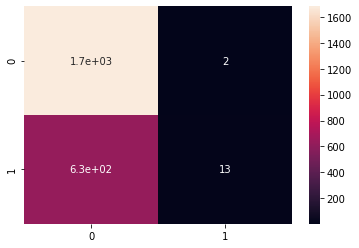

In [291]:
svm_model  = SVC(probability=True)
svm_model.fit(x_train,y_train)

y_pred = svm_model.predict(x_test)
print(classification_report(y_test,y_pred))
conf_mat = confusion_matrix(y_test,y_pred)

sns.heatmap(conf_mat,annot=True)
svm_model, svm_train_auc, svm_test_auc, svm_train_accuracy, svm_test_accuracy,svm_f1, svm_precision,svm_recall= check_scores(svm_model,x_train,x_test)

## Model 5: XGBoost

C:\Users\user\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:51:28] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
100
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1684
           1       0.86      0.86      0.86       641

    accuracy                           0.92      2325
   macro avg       0.90      0.90      0.90      2325
weighted avg       0.92      0.92      0.92      2325

The accuracy on train dataset is 1.0
The accuracy on test dataset is 0.923010752688172

Train confusion matrix:
[[3490    0]
 [   0 1228]]

Test confusion matrix:
[[1593   91]
 [  88  553]]

AUC on train data: 1.0
AUC on test data: 0.981598860153931
F1 score is: 0.8607003891050585
Precision is: 0.8586956521739131
Recall is: 0.8627145085803433


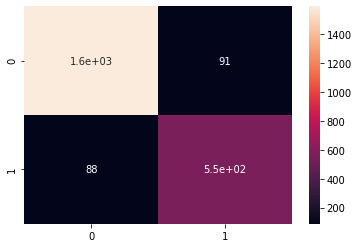

In [293]:
xgb_model = XGBClassifier(n_estimators=100)

xgb_model.fit(x_train,y_train)
# number of trees
print(xgb_model.n_estimators)
y_pred = xgb_model.predict(x_test)

print(classification_report(y_test,y_pred))
conf_mat = confusion_matrix(y_test,y_pred)
sns.heatmap(conf_mat,annot=True)
xgb_model, xgb_train_auc, xgb_test_auc, xgb_train_accuracy, xgb_test_accuracy,xgb_f1, xgb_precision,xgb_recall= check_scores(xgb_model,x_train,x_test)

## Model 6: Naive Bayes

              precision    recall  f1-score   support

           0       0.93      0.80      0.86      1684
           1       0.61      0.84      0.71       641

    accuracy                           0.81      2325
   macro avg       0.77      0.82      0.78      2325
weighted avg       0.84      0.81      0.82      2325

The accuracy on train dataset is 0.8052140737600678
The accuracy on test dataset is 0.8094623655913978

Train confusion matrix:
[[2815  675]
 [ 244  984]]

Test confusion matrix:
[[1346  338]
 [ 105  536]]

AUC on train data: 0.8978806361591518
AUC on test data: 0.902562800849326
F1 score is: 0.7075907590759076
Precision is: 0.6132723112128147
Recall is: 0.8361934477379095


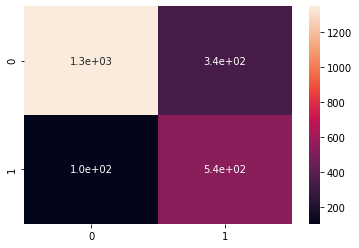

In [294]:
NB_model = GaussianNB()
NB_model.fit(x_train,y_train)
y_pred = NB_model.predict(x_test)

print(classification_report(y_test,y_pred))
conf_mat = confusion_matrix(y_test,y_pred)
sns.heatmap(conf_mat,annot=True)
NB_model, NB_train_auc, NB_test_auc, NB_train_accuracy, NB_test_accuracy,NB_f1, NB_precision,NB_recall= check_scores(NB_model,x_train,x_test)

# plot all ROC curves

C:\Users\user\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
C:\Users\user\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:59:34] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


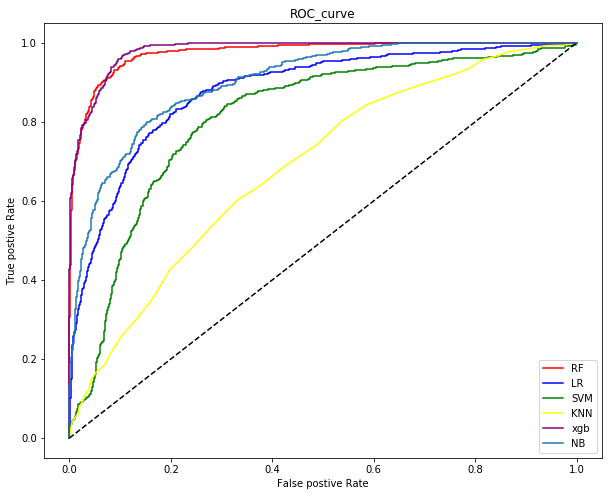

In [296]:
# plot all roc curves
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# fit all models
lr_optimal_model.fit(x_train,y_train)
KNN_model.fit(x_train,y_train)
rf_model.fit(x_train,y_train)
svm_model.fit(x_train,y_train)
xgb_model.fit(x_train,y_train)
NB_model.fit(x_train,y_train)

y_pred_propa_RF = rf_model.predict_proba(x_test)
y_pred_propa_LR = lr_optimal_model.predict_proba(x_test)
y_pred_propa_SVM = svm_model.predict_proba(x_test)
y_pred_propa_KNN = KNN_model.predict_proba(x_test)
y_pred_propa_xgb = xgb_model.predict_proba(x_test)
y_pred_propa_NB = NB_model.predict_proba(x_test)

fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test,y_pred_propa_RF[:,1])
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test,y_pred_propa_LR[:,1])
fpr_SVM, tpr_SVM, thresholds_SVM = roc_curve(y_test,y_pred_propa_SVM[:,1])
fpr_KNN, tpr_KNN, thresholds_KNN = roc_curve(y_test,y_pred_propa_KNN[:,1])
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test,y_pred_propa_xgb[:,1])
fpr_NB, tpr_NB, thresholds_NB = roc_curve(y_test,y_pred_propa_NB[:,1])

plt.figure(figsize=(10,8))
plt.plot(fpr_rf, tpr_rf, label='RF',c='red')
plt.plot(fpr_lr, tpr_lr, label='LR',c='blue')
plt.plot(fpr_SVM, tpr_SVM, label='SVM',c='green')
plt.plot(fpr_KNN, tpr_KNN, label='KNN',c='yellow')
plt.plot(fpr_xgb, tpr_xgb, label='xgb',c='purple')
plt.plot(fpr_NB, tpr_NB, label='NB')
plt.plot([0,1],[0,1], 'k--',c='black')
plt.title("ROC_curve")
plt.xlabel("False postive Rate")
plt.ylabel("True postive Rate")
plt.legend()


In [297]:
# auc score
auc_RF = roc_auc_score(y_test,y_pred_propa_RF[:,1])
auc_LR = roc_auc_score(y_test,y_pred_propa_LR[:,1])
auc_SVM = roc_auc_score(y_test,y_pred_propa_SVM[:,1])
auc_KNN = roc_auc_score(y_test,y_pred_propa_KNN[:,1])
auc_xgb = roc_auc_score(y_test,y_pred_propa_xgb[:,1])
auc_NB = roc_auc_score(y_test,y_pred_propa_NB[:,1])

print(f" auc score of RF = {100* auc_RF:.3} %")
print(f" auc score of LR = {100* auc_LR:.3} %")
print(f" auc score of SVM = {100* auc_SVM:.3} %")
print(f" auc score of KNN = {100* auc_KNN:.3} %")
print(f" auc score of xgb = {100* auc_xgb:.3} %")
print(f" auc score of NB = {100* auc_NB:.3} %")

 auc score of RF = 97.6 %
 auc score of LR = 88.0 %
 auc score of SVM = 81.0 %
 auc score of KNN = 68.6 %
 auc score of xgb = 98.2 %
 auc score of NB = 90.3 %
